**NOTE**: This notebook was originally run in Google Colab using a GPU

# Install Detectron 2

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
root_dir = "drive/MyDrive/NNextPitch"
%cd $root_dir

Mounted at /content/drive
/content/drive/MyDrive/NNextPitch


In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
#!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 20.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=1cb901abb18bfdc38a620eff688ff6294da97021532ac362945a0d6b051288f4
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheel

In [6]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [5]:
# Some basic setup:
# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Prepare Data for Detectron2

In [3]:
from detectron2.data.datasets import register_coco_instances

train_json = 'data/detectron-data/coco/training/pitcher_annotations_train.json'
val_json = 'data/detectron-data/coco/validation/pitcher_annotations_val.json'
train_img_path = 'data/detectron-data/images/training'
val_img_path = 'data/detectron-data/images/validation'

register_coco_instances("d2-training", {}, train_json, train_img_path)
register_coco_instances("d2-validation", {}, val_json, val_img_path)

In [7]:
# Training
train_metadata = MetadataCatalog.get("d2-training")
train_dataset_dicts = DatasetCatalog.get("d2-training")

# Validation
val_metadata = MetadataCatalog.get("d2-validation")
val_dataset_dicts = DatasetCatalog.get("d2-validation")

WARNING [02/28 21:59:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/28 21:59:57 d2.data.datasets.coco]: Loaded 500 images in COCO format from data/detectron-data/coco/training/pitcher_annotations_train.json
WARNING [02/28 21:59:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/28 21:59:57 d2.data.datasets.coco]: Loaded 100 images in COCO format from data/detectron-data/coco/validation/pitcher_annotations_val.json


# Visualize Labeled Images

## Training Set

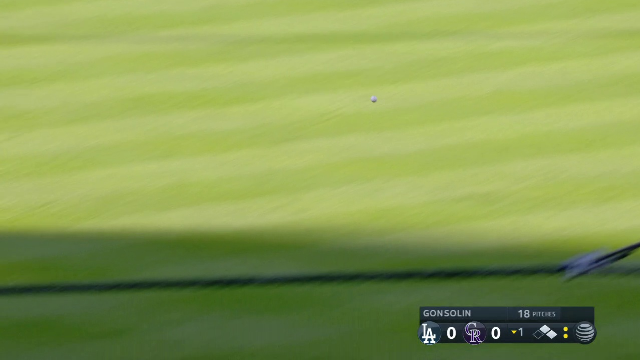

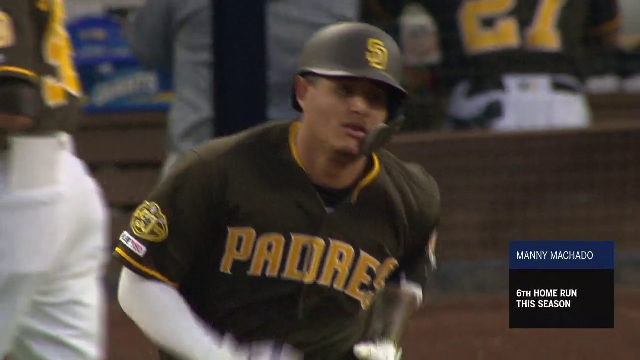

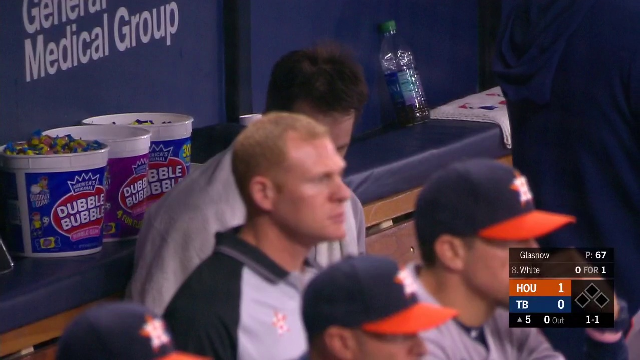

In [8]:
for d in random.sample(train_dataset_dicts, 3):
   img = cv2.imread(d["file_name"])
   visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
   out = visualizer.draw_dataset_dict(d)
   cv2_imshow(out.get_image()[:, :, ::-1])

## Validation Set

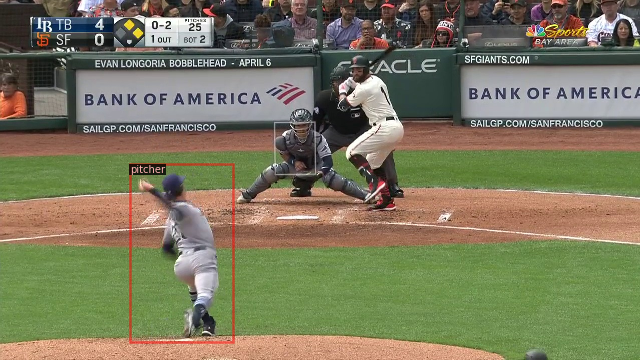

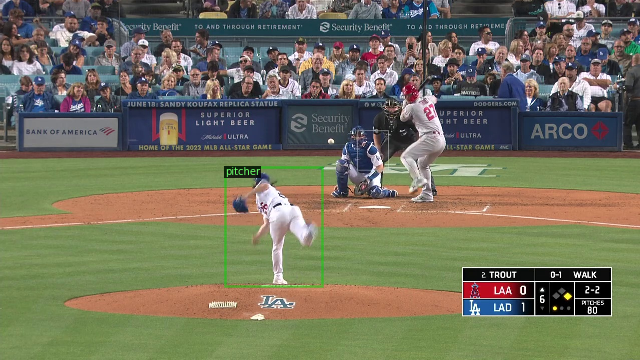

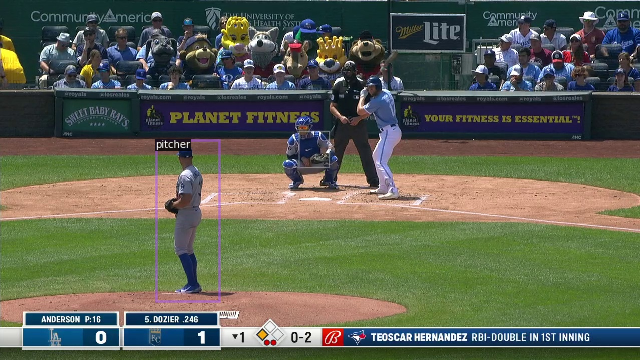

In [9]:
for d in random.sample(val_dataset_dicts, 3):
   img = cv2.imread(d["file_name"])
   visualizer = Visualizer(img[:, :, ::-1], metadata=val_metadata, scale=0.5)
   out = visualizer.draw_dataset_dict(d)
   cv2_imshow(out.get_image()[:, :, ::-1])

# Model Training
The key to training success here is using the negative samples (images that do not include a labeled pitcher) within the training set. The default setting of Detectron2 is to omit these samples. Otherwise, the model predicts position players at a higher clip.

- Resource: https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=U5LhISJqWXgM

In [10]:
from detectron2.engine import DefaultTrainer

# Set training parameters
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("d2-training",)
cfg.DATASETS.TEST = ("d2-validation",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml") # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # Pick a good LR - used from example
cfg.SOLVER.MAX_ITER = 2500    # Arbitrary 2000 iterations
cfg.SOLVER.STEPS = []         # Do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # The "RoIHead batch size" (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1             # Only has one class (pitcher)
cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False # Include negative (no object) samples in training

In [11]:
# Train
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/28 22:00:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:04, 36.6MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[02/28 22:00:46 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/28 22:01:04 d2.utils.events]:  eta: 0:19:14  iter: 19  total_loss: 0.8602  loss_cls: 0.6447  loss_box_reg: 0.08536  loss_rpn_cls: 0.0878  loss_rpn_loc: 0.002461  time: 0.4489  last_time: 0.5015  data_time: 0.0388  last_data_time: 0.0062   lr: 4.9953e-06  max_mem: 2636M
[02/28 22:01:13 d2.utils.events]:  eta: 0:19:10  iter: 39  total_loss: 0.7792  loss_cls: 0.5798  loss_box_reg: 0.0914  loss_rpn_cls: 0.1027  loss_rpn_loc: 0.0026  time: 0.4503  last_time: 0.5358  data_time: 0.0081  last_data_time: 0.0303   lr: 9.9902e-06  max_mem: 2636M
[02/28 22:01:22 d2.utils.events]:  eta: 0:19:06  iter: 59  total_loss: 0.6682  loss_cls: 0.4773  loss_box_reg: 0.09266  loss_rpn_cls: 0.09209  loss_rpn_loc: 0.003191  time: 0.4559  last_time: 0.4780  data_time: 0.0069  last_data_time: 0.0081   lr: 1.4985e-05  max_mem: 2636M
[02/28 22:01:32 d2.utils.events]:  eta: 0:19:04  iter: 79  total_loss: 0.569  loss_cls: 0.3823  loss_box_reg: 0.07999  loss_rpn_cls: 0.08145  loss_rpn_loc: 0.001949  time: 0.4597  

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

# Model Testing

Admittedly, I used a visual inspection process of the 100 validation images to judge performance here. The "hyperparameter" of interest here is the score_thresh_test parameter that controls the stringency of object inclusion. A value of 0.97 was found to be optimal. Objects (i.e. pitchers) called with a probability below 97% tend to be hitters and position players (false positives), while objects called with a probability above 97% tend to be pitchers (true positives). Of course, there are exceptions here. The main importance is that all pitchers in the stretch are detected, which is the case.

In [14]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to the model we just trained
cfg.TEST.DETECTIONS_PER_IMAGE = 1 # Maximum number of detections per image
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.97 # Set a custom testing threshold (probability threshold of calling object a pitcher)
predictor = DefaultPredictor(cfg)

[02/28 22:22:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [15]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(val_dataset_dicts, 100):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=val_metadata, scale=0.5, instance_mode=ColorMode.IMAGE_BW)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Output hidden; open in https://colab.research.google.com to view.

# Saving Model

Finding that the model_final.pth weights file works while the model saved below does not.. unsure why.

In [47]:
#from detectron2.modeling import build_model
#model = build_model(cfg)
#torch.save(model.state_dict(), os.path.join(cfg.OUTPUT_DIR, "pitcher_detector.faster_rcnn.pth"))

# Testing the Model on a Series of Images

Note: Instances found where desired! The first 9 images and the last 4 images contain no instances of the pitcher object.

In [42]:
import glob
import re
import cv2

In [44]:
image_dir = 'data/example-data/images'
files = sorted(os.listdir(image_dir), key=lambda x: int(x.split("-")[-1].split(".jpg")[0]))
files = [os.path.join(image_dir, file_) for file_ in files]

In [46]:
for file_ in files:
  image = cv2.imread(file_)
  outputs = predictor(image)
  print("Instances:", outputs["instances"])
  print(len(outputs["instances"]))

Instances: Instances(num_instances=0, image_height=720, image_width=1280, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])
0
Instances: Instances(num_instances=0, image_height=720, image_width=1280, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])
0
Instances: Instances(num_instances=0, image_height=720, image_width=1280, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])
0
Instances: Instances(num_instances=0, image_height=720, image_width=1280, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])
0
Instances: Instances